# Wide Angle and Macro Lens Combined Test

In [1]:
import sys
import os
sys.path.insert(0, "../../python")
sys.path.insert(1, "../../../photoDAQ")

import numpy as np
from beam.beams import laserpulse
from beam.beams import laserbeam
from beam.elements import plasma
from beam.elements import optic
from beam import interactions
from ionization import ionization
from ionization import adk
from lens import profile
from lens import bessel
from propagation import laser
import matplotlib.pyplot as plt
from scipy import ndimage
import file
from PIL import Image
from scipy.optimize import curve_fit
plt.style.use('presentation')

path = '/mnt/md0/DAQ/'
file.PATH = path

In [2]:
from scipy.interpolate import UnivariateSpline
def fwhm(x, y):
    y = y-np.min(y)
    spline = UnivariateSpline(x, y-np.max(y)/2, s=0)
    r1, r2 = spline.roots()[:2]
    return abs(r2-r1)

Average pixel size 4.225um (0.005)
The box size is 131.7px so precision is at best 0.032um


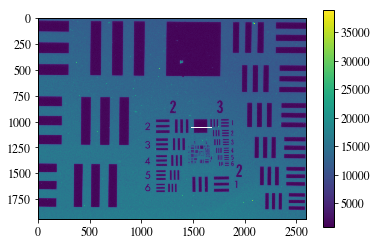

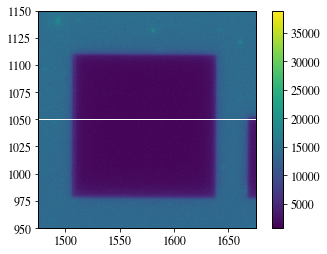

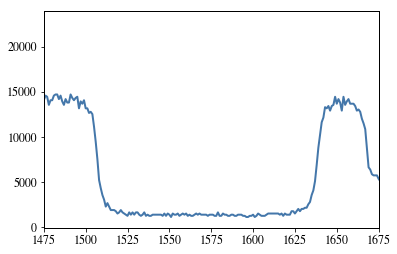

131.678800189
4.22847109178


In [3]:
N = 100
px_sizes = np.zeros(N)
a = 1475
b = 1675
c = 1050
dc = 100
for i in range(N):
    image = file.load_IMAGE('17571186', 1909110001, i)
    image = image.transpose(Image.FLIP_TOP_BOTTOM)
    im = np.array(image)
    x = np.arange(a, b)
    width = fwhm(x, im[c, a:b])
    px_sizes[i] = 111.36*5/width
print('Average pixel size %0.3fum (%0.3f)' % (np.average(px_sizes), np.std(px_sizes)))
macro_px = np.average(px_sizes)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width, np.average(px_sizes)*1/width))

plt.imshow(image)
plt.colorbar()
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.imshow(image)
plt.colorbar()
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c-dc, c+dc)
plt.show()

im = np.array(image)
plt.plot(im[c, :])
plt.xlim(a, b)
plt.show()

x = np.arange(a, b)
width = fwhm(x, im[c, a:b])
print(width)
print(111.36*5/width)

Average pixel size 214.0um (0.7)
The box size is 10.4px so precision is at best 20.5um


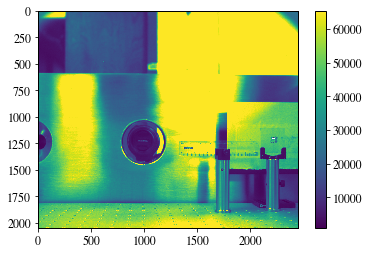

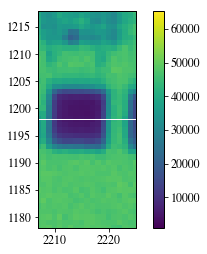

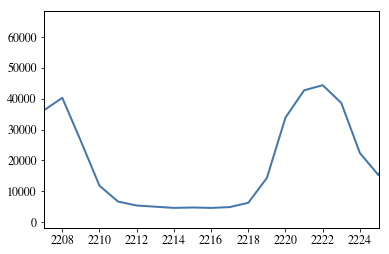

10.4176070953
213.796698189


In [4]:
N = 100
px_sizes = np.zeros(N)
a = 2207
b = 2225
c = 1198
dc = 20
for i in range(N):
    image = file.load_IMAGE('17529184', 1909110002, i)
    image = image.transpose(Image.FLIP_TOP_BOTTOM)
    im = np.array(image)
    x = np.arange(a, b)
    width = fwhm(x, im[c, a:b])
    px_sizes[i] = 445.45*5/width
print('Average pixel size %0.1fum (%0.1f)' % (np.average(px_sizes), np.std(px_sizes)))
wide_px = np.average(px_sizes)
print('The box size is %0.1fpx so precision is at best %0.1fum' % (width, np.average(px_sizes)*1/width))

plt.imshow(image)
plt.colorbar()
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.imshow(image)
plt.colorbar()
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c-dc, c+dc)
plt.show()

im = np.array(image)
plt.plot(im[c, :])
plt.xlim(a, b)
plt.show()

x = np.arange(a, b)
width = fwhm(x, im[c, a:b])
print(width)
print(445.45*5/width)

Average pixel size 211.78um (0.02)


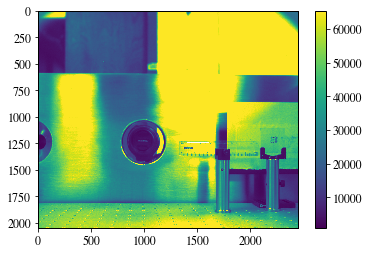

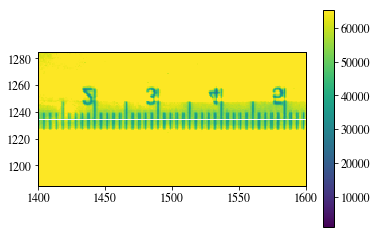

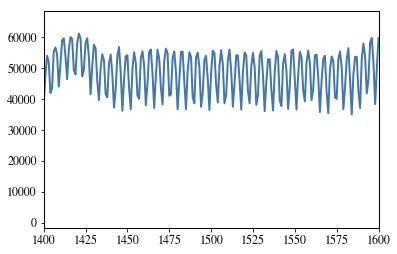

211.771870305


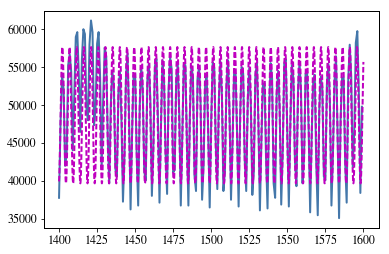

In [5]:
N = 100
px_sizes = np.zeros(N)
a = 1400
b = 1600
c = 1235
dc = 50
def cos(x, L, A, dy, x0):
    return A*np.cos(2*np.pi*x/L+x0)+dy
for i in range(N):
    image = file.load_IMAGE('17529184', 1909110002, i)
    image = image.transpose(Image.FLIP_TOP_BOTTOM)
    im = np.array(image)
    x = np.arange(a, b)
    popt, pcov = curve_fit(cos, x, im[c, a:b], p0=[4.7, -9000, 48e3, 10])
    px_sizes[i] = 1000/popt[0]
print('Average pixel size %0.2fum (%0.2f)' % (np.average(px_sizes), np.std(px_sizes)))
wide_px = np.average(px_sizes)

plt.imshow(image)
plt.colorbar()
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.imshow(image)
plt.colorbar()
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c-dc, c+dc)
plt.show()

im = np.array(image)
plt.plot(im[c, :])
plt.xlim(a, b)
plt.show()

x = np.arange(a, b)
popt, pcov = curve_fit(cos, x, im[c, a:b], p0=[4.7, -9000, 48e3, 10])
print(1000/popt[0])

x2 = np. linspace(1400, 1600, 5000)
plt.plot(x, im[c, a:b])
plt.plot(x2, cos(x2, *popt), 'm--')
plt.show()

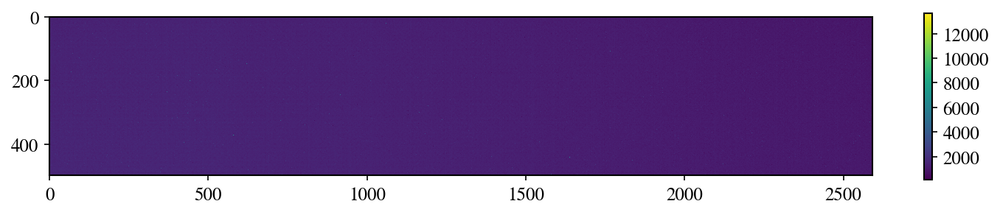

In [6]:
# Create backgrounds
im = np.zeros((500, 2592))
for i in range(1, N):
    image = file.load_IMAGE('17571186', 1909120019, i)
    image = image.transpose(Image.FLIP_TOP_BOTTOM)
    im += np.array(image)

macro_bgd = im/99
plt.figure(figsize=(12, 2), dpi=150)
plt.imshow(macro_bgd)
plt.colorbar()
plt.show()

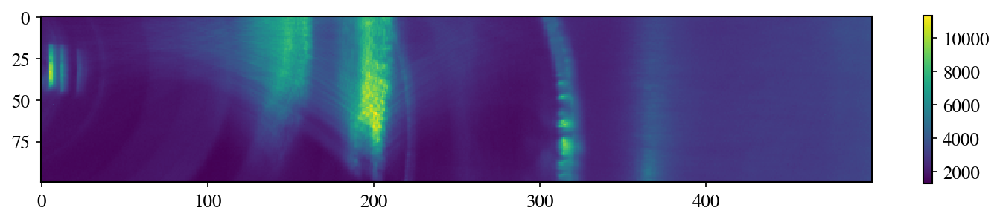

In [7]:
# Create backgrounds
im = np.zeros((100, 500))
for i in range(1, N):
    image = file.load_IMAGE('17529184', 1909120019, i)
    image = image.transpose(Image.FLIP_TOP_BOTTOM)
    im += np.array(image)

wide_bgd = im/99
plt.figure(figsize=(12, 2), dpi=150)
plt.imshow(wide_bgd)
plt.colorbar()
plt.show()

In [51]:
# Specify the pressure for every dataset
pressure = {1909120004: 3.0,
            1909120010: 4.0,
            1909120012: 8.0,
            1909120020: 0.2,
            1909120021: 0.4,
            1909120024: 1.4}

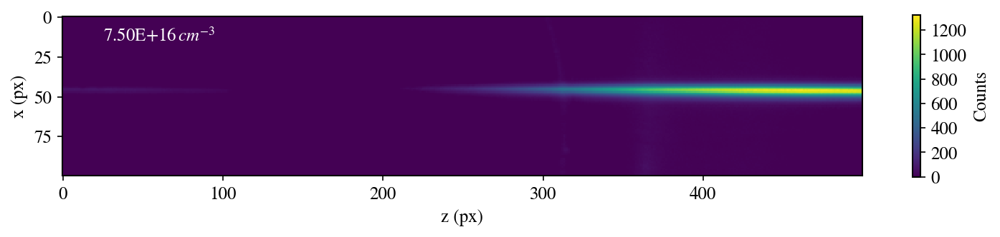

In [76]:
def plot_image(instr, dataset, shot, background=True):
    if instr == '17571186':
        px_size = macro_px
        bgd = macro_bgd
    elif instr == '17529184':
        px_size = wide_px
        bgd = wide_bgd
    shot = np.array(shot)
    first = True
    for i in shot:
        image = file.load_IMAGE(instr, dataset, i)
        image = image.transpose(Image.FLIP_TOP_BOTTOM)
        if first:
            im = np.array(image, dtype='double')
            first = False
        else:
            im += np.array(image)
    if background:
        im = im/len(shot) - bgd
    else:
        im = im/len(shot)
    density = pressure[dataset]/4*1e17
    
    height, width = np.shape(im)
    
    plt.figure(figsize=(12, 2), dpi=150)
    plt.imshow(im/16, vmin=0)
    cb = plt.colorbar()
    cb.set_label(r'Counts')
    plt.xlabel(r'z (px)')
    plt.ylabel(r'x (px)')
    #plt.plot([])
    plt.text(width*0.05, height*0.15, r'%0.2E$\,cm^{-3}$'%density, color='w')
    plt.show()
plot_image('17529184', 1909120004, range(100))

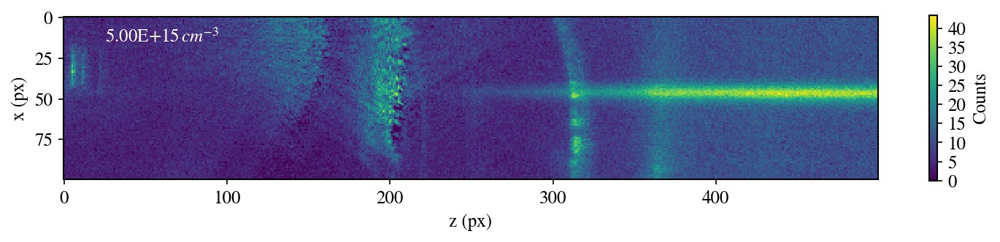

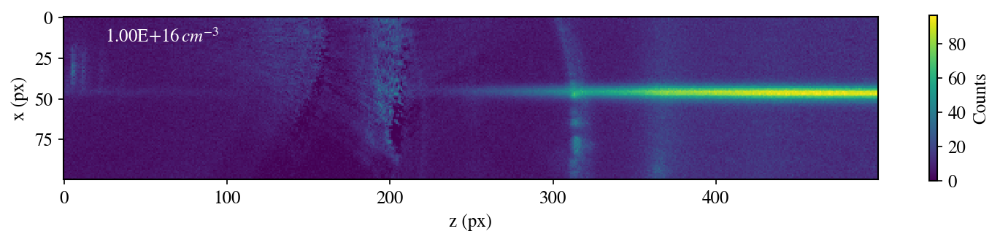

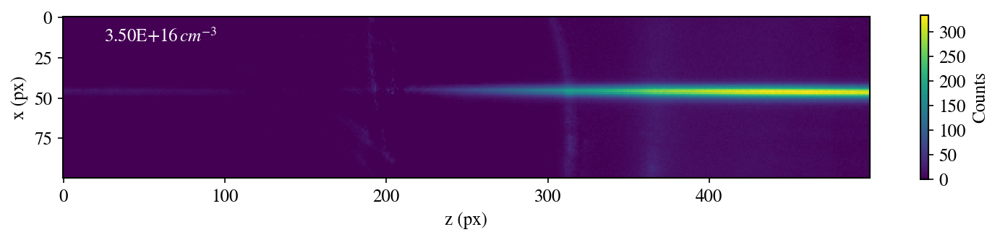

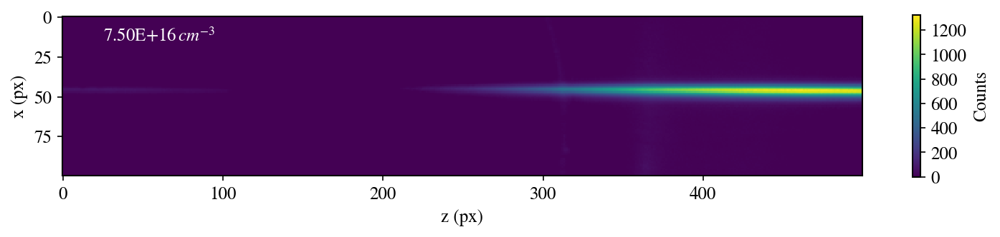

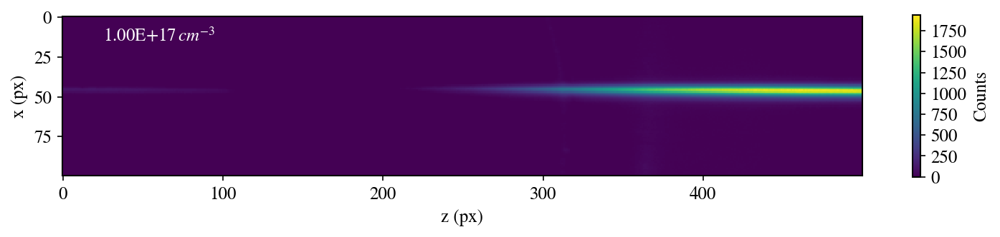

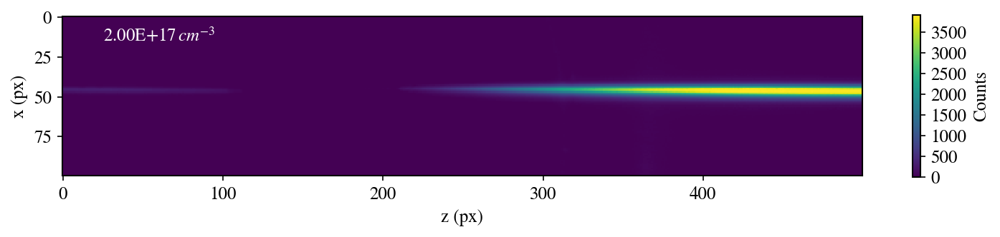

In [84]:
plot_image('17529184', 1909120020, range(100))
plot_image('17529184', 1909120021, range(100))
plot_image('17529184', 1909120024, range(1, 100))
plot_image('17529184', 1909120004, range(100))
plot_image('17529184', 1909120010, range(100))
plot_image('17529184', 1909120012, range(100))

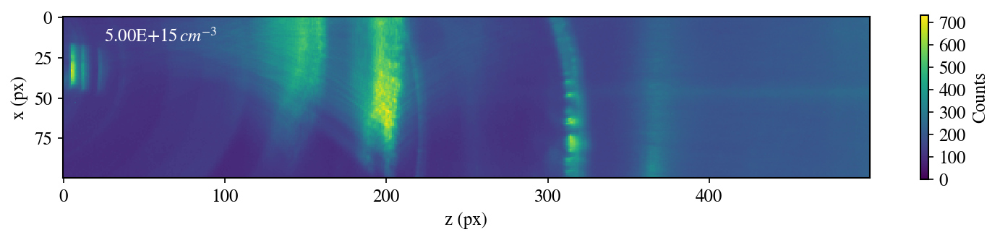

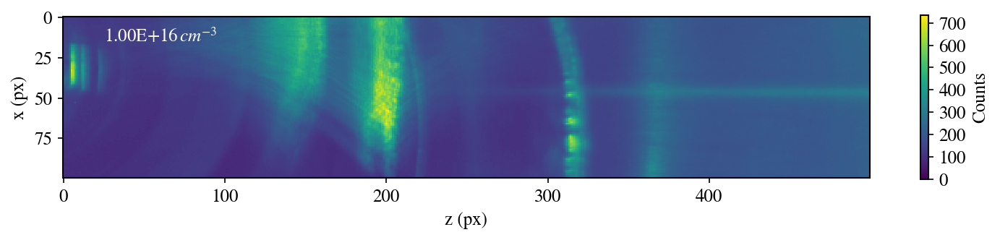

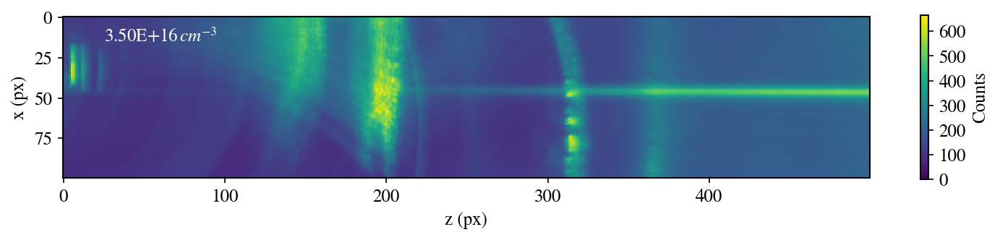

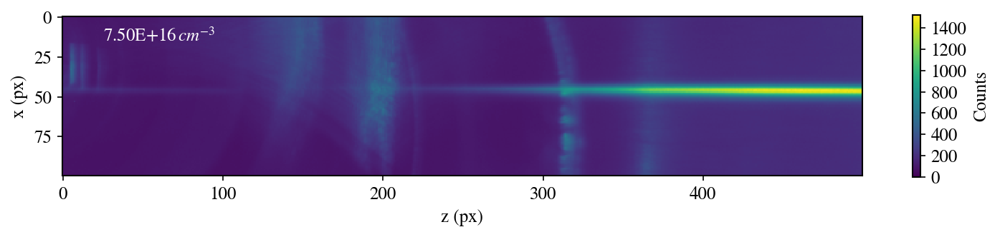

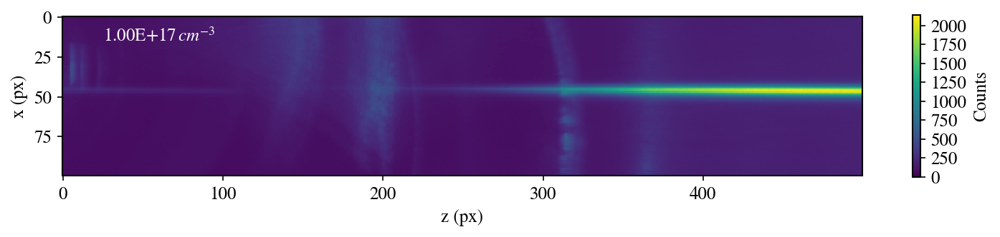

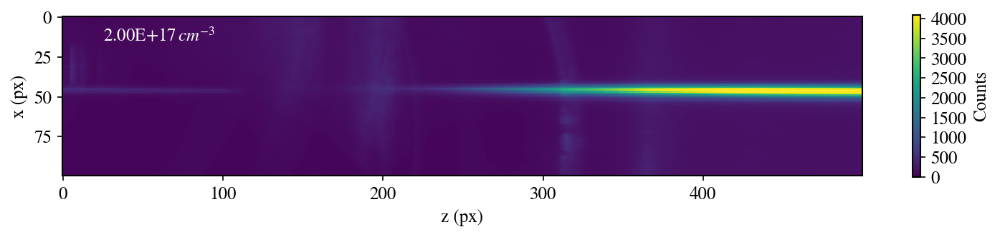

In [80]:
plot_image('17529184', 1909120020, range(100), False)
plot_image('17529184', 1909120021, range(100), False)
plot_image('17529184', 1909120024, range(1, 100), False)
plot_image('17529184', 1909120004, range(100), False)
plot_image('17529184', 1909120010, range(100), False)
plot_image('17529184', 1909120012, range(100), False)

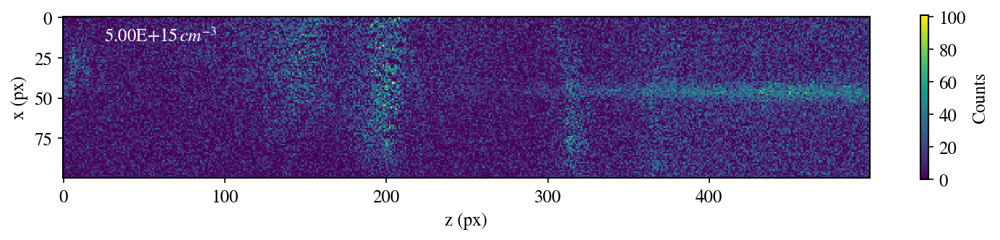

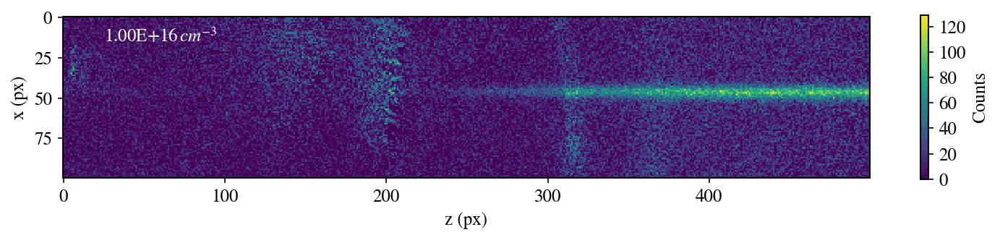

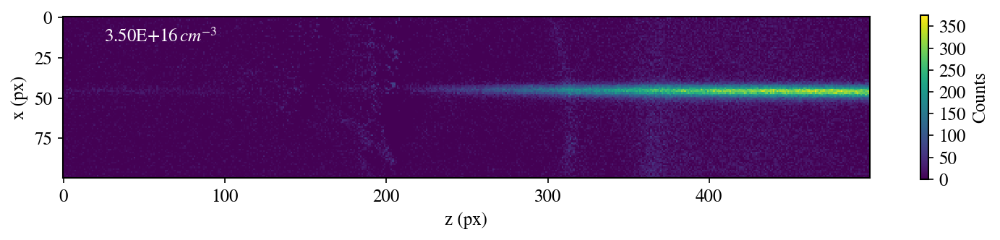

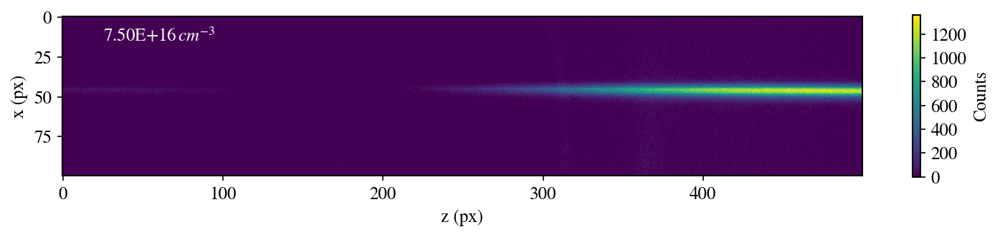

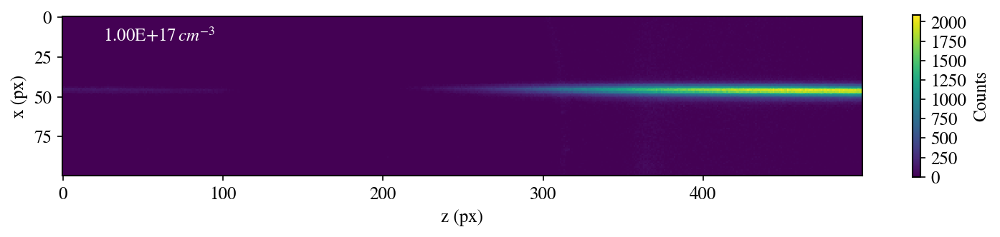

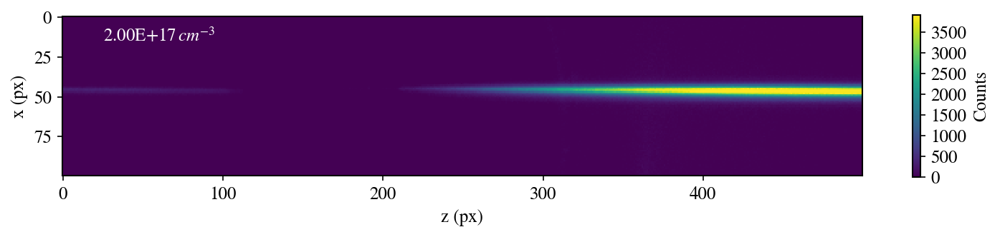

In [86]:
plot_image('17529184', 1909120020, range(1))
plot_image('17529184', 1909120021, range(1))
plot_image('17529184', 1909120024, range(1, 2))
plot_image('17529184', 1909120004, range(1))
plot_image('17529184', 1909120010, range(1))
plot_image('17529184', 1909120012, range(1))

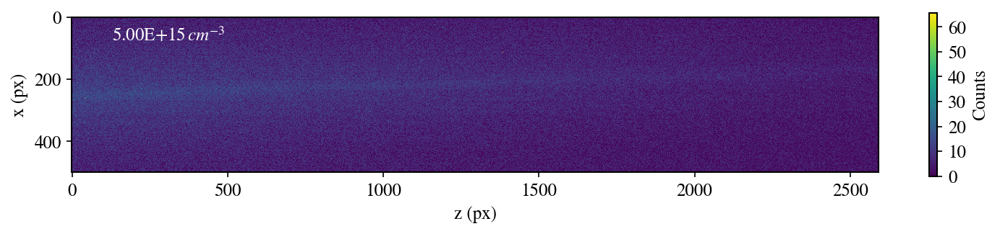

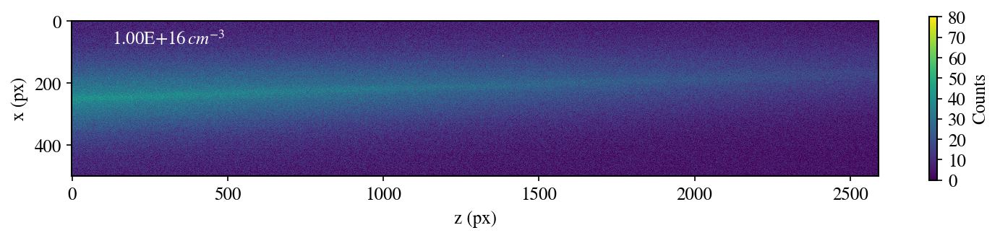

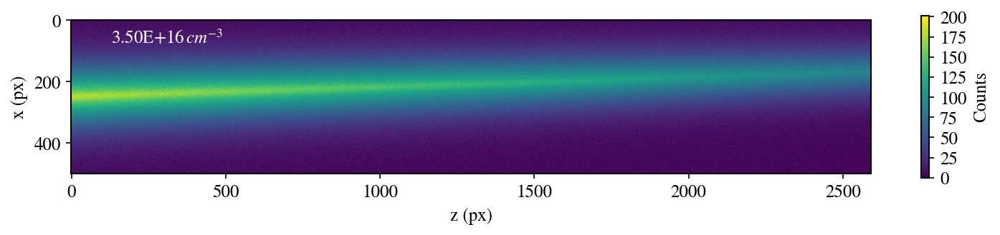

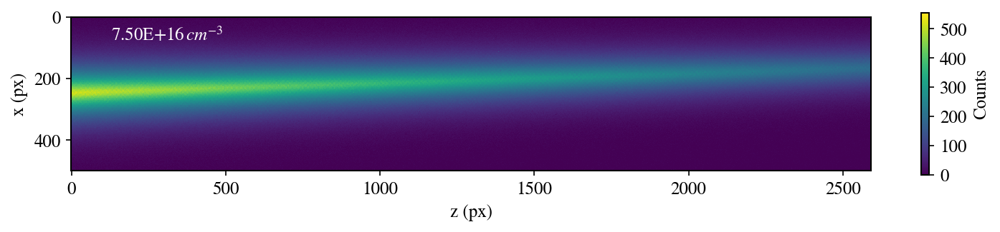

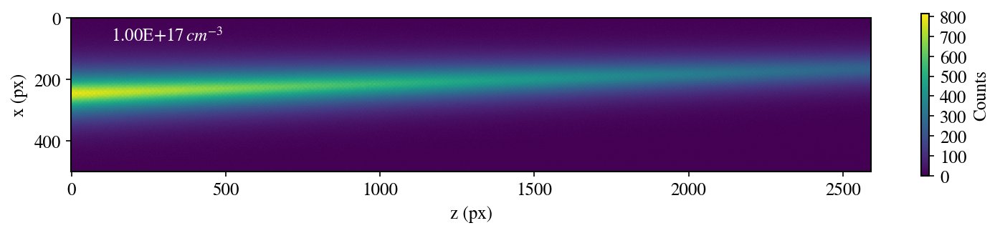

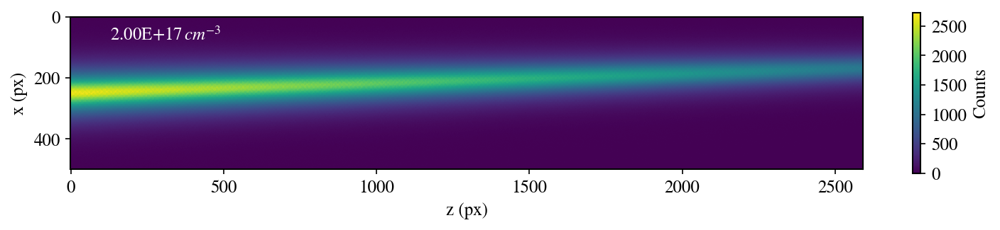

In [87]:
plot_image('17571186', 1909120020, range(100))
plot_image('17571186', 1909120021, range(100))
plot_image('17571186', 1909120024, range(1, 100))
plot_image('17571186', 1909120004, range(100))
plot_image('17571186', 1909120010, range(100))
plot_image('17571186', 1909120012, range(100))

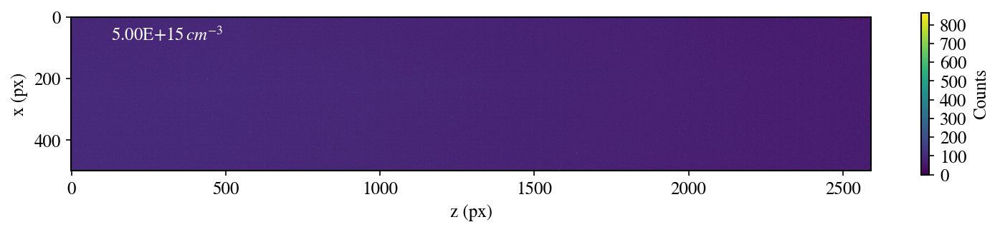

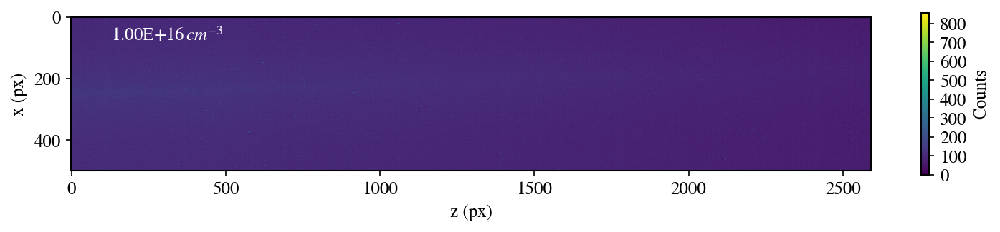

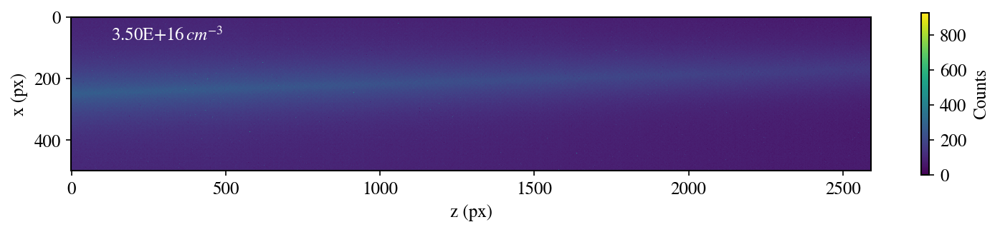

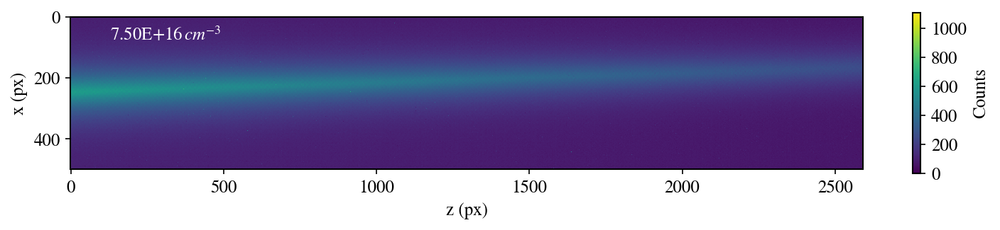

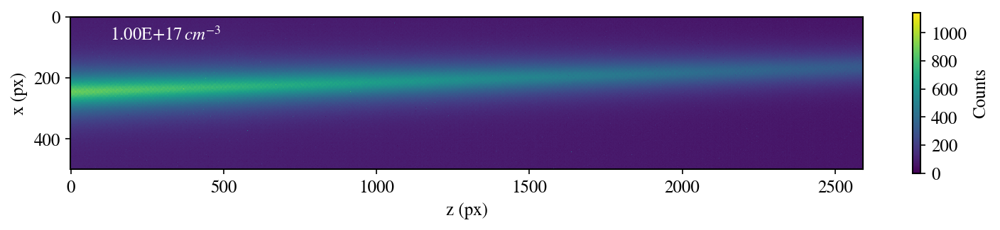

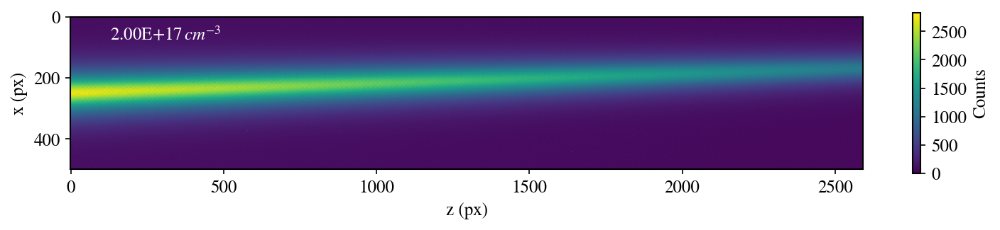

In [91]:
plot_image('17571186', 1909120020, range(100), False)
plot_image('17571186', 1909120021, range(100), False)
plot_image('17571186', 1909120024, range(1, 100), False)
plot_image('17571186', 1909120004, range(100), False)
plot_image('17571186', 1909120010, range(100), False)
plot_image('17571186', 1909120012, range(100), False)

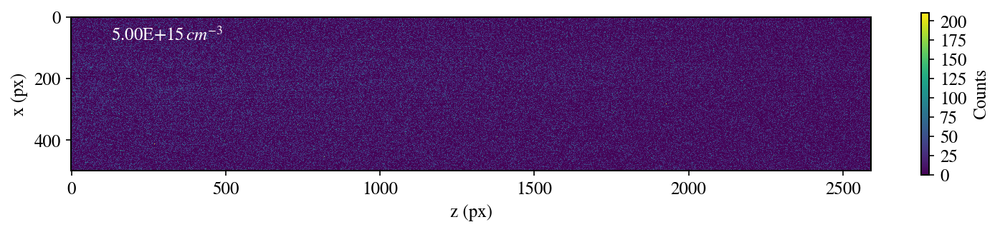

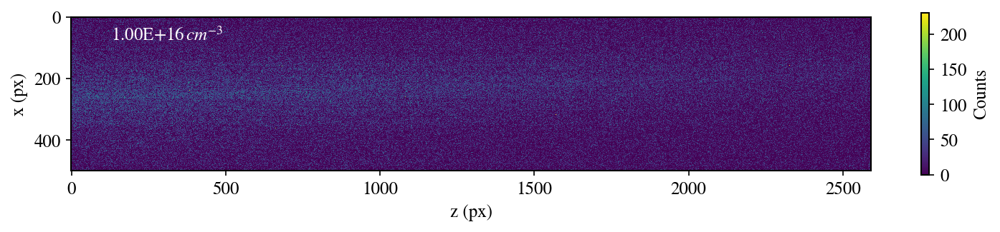

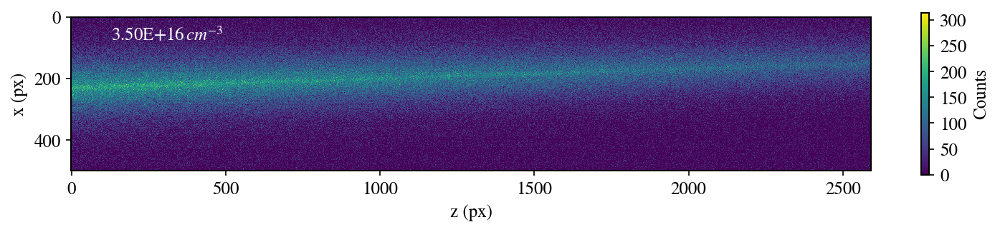

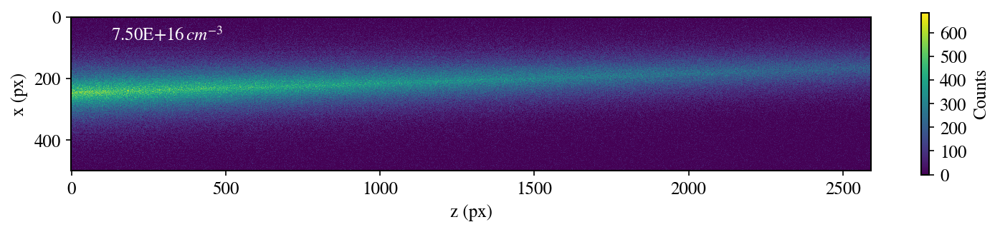

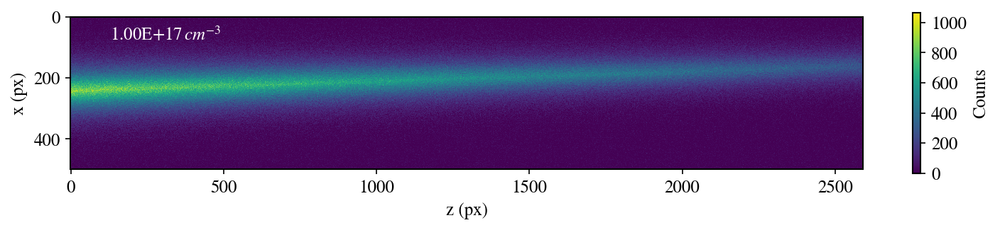

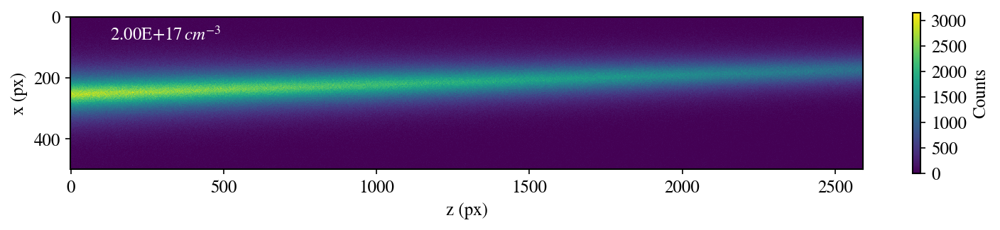

In [92]:
plot_image('17571186', 1909120020, range(1))
plot_image('17571186', 1909120021, range(1))
plot_image('17571186', 1909120024, range(1, 2))
plot_image('17571186', 1909120004, range(1))
plot_image('17571186', 1909120010, range(1))
plot_image('17571186', 1909120012, range(1))